In [1]:
%%capture
import matplotlib.pyplot as plt
import numpy as np
import cv2

try: cv2.setNumThreads(0)
except: pass
from caiman import movie
import os
# %matplotlib inline
%config InlineBackend.figure_format = 'retina'

import pandas as pd
from itertools import product
from collections import OrderedDict

from sys import path as syspath
syspath.append(os.path.expanduser("~/srdjan_functs/"))

from physio_def_1 import *
from matplotlib.colors import LogNorm

from numeric import *
from collections import Counter

import plotly_express as plx

In [2]:
from general_functions import multi_map

In [3]:
# some definitions
def climb(x,blurredWeights,diag=True,min_gradient = 0):
    dims = blurredWeights.shape
    # x = (60,60)
    x = x+(blurredWeights[x[0],x[1]],)
    xs = [x]
    for i in range(100):
        vs = []
        for di,dj in product([-1,0,1],[-1,0,1]):
            if not diag:
                if di*dj!=0: continue
            i,j = x[0]+di,x[1]+dj
            if i<0 or i>=dims[0] or j<0 or j>=dims[1]:
                continue
            vs += [(i,j,blurredWeights[i,j])]
        x1 = vs[np.argmax(vs,axis=0)[-1]]
        dx = x1[-1]-x[-1]
        if dx<=0:
            break
        elif dx<=min_gradient:
            return (None,)
        else:
            x = x1
            xs += [x]
    return x[:2]

def crawlDict(image, th=-np.inf, diag=False, min_gradient=0):
    A_ = [(i,j)+climb((i,j),image,diag=diag,min_gradient=min_gradient) for i,j in product(range(image.shape[0]),range(image.shape[1])) if image[i,j]>th]
    A_ = [el for el in A_ if el[-1] is not None]
    B_ = OrderedDict()
    for (i0,j0,i1,j1) in A_:
        if (i1,j1) not in B_:
            B_[(i1,j1)] = []
        B_[(i1,j1)] += [(i0,j0)]
    return B_

def edges2nodes(x,start=0,direction=1):
    if np.array(x[0]).shape != (2,2):
        x = [(el[:2],el[2:]) for el in x]
    nodes = list(x[start][::direction])

    for i in range(len(x)-1):
        nexts = [edge for edge in x if (edge[0]==nodes[-1] or edge[1]==nodes[-1])]
        for cand in np.unique(sum(nexts,()),axis=0):
            if tuple(cand) not in nodes:
                nodes += [tuple(cand)]
    return nodes

class Regions:
    def __init__(self, image, th=-np.inf, diag=False, min_gradient=0):
        from pandas import DataFrame
        self.image = image
        A_ = [(i,j)+climb((i,j),image,diag=diag,min_gradient=min_gradient) for i,j in product(range(image.shape[0]),range(image.shape[1])) if image[i,j]>th]
        A_ = [el for el in A_ if el[-1] is not None]
        B_ = OrderedDict()
        for (i0,j0,i1,j1) in A_:
            if (i1,j1) not in B_:
                B_[(i1,j1)] = []
            B_[(i1,j1)] += [(i0,j0)]
        self.df = DataFrame(OrderedDict([
            ("peak",list(B_.keys())),
            ("pixels",list(B_.values()))
        ]))
        self.df["peakValue"] = [image[p] for p in B_]
        self.update()

    def update(self, movie_=None):
        self.df["size"] = self.df["pixels"].apply(len)
        self.calcEdgeIds()
        self.calcEdges()
        self.df["boundary"] = [edges2nodes(self.df["edges"][j]) for j in self.df.index]
        self.calcNNmap()
        if movie_ is not None:
            self.calcTraces(movie_)
    
    @property
    def peak(self):
        return self.df["peak"]
    @property
    def pixels(self):
        return self.df["pixels"]
    @property
    def edges(self):
        return self.df["edges"]
    
    def calcEdgeIds(self):
        dround = np.vstack([(-1,-1),(-1, 1),( 1, 1),( 1,-1),(-1,-1)])
        dedges = []
        for el in zip(dround[:-1],dround[1:]):
            el = np.array(el)+1
            el = np.vstack(sorted(el,key=np.linalg.norm))-1
            dedges += [el*.5]
        dedges = np.stack(dedges)
        edgeID = OrderedDict()
        for k,pixelSet in zip(self.peak,self.pixels):
            for x,y in pixelSet:
                edges = dedges.copy()
                edges[...,0] += x
                edges[...,1] += y
                for edge in edges.reshape((-1,4)):
                    edge = tuple(edge)
                    if edge not in edgeID:
                        edgeID[edge] = []
                    edgeID[edge] += [k]
                    if len(edgeID[edge])==2 and edgeID[edge][0]==edgeID[edge][1]:
                        del edgeID[edge]
        self.edgeIDs = edgeID
    
    def calcEdges(self):
        invEdgeID = OrderedDict()
        if "edgeIDs" not in locals():
            self.calcEdgeIds()
        for k in self.edgeIDs:
            for p in self.edgeIDs[k]:
                if p not in invEdgeID:
                    invEdgeID[p] = []
                invEdgeID[p] += [k]
#         self.edges = OrderedDict([(p,invEdgeID[p]) for p in self.peaks])
        self.df["edges"] = [invEdgeID[p] for p in self.peak]
    
#     @property
    def getEdges(self,ix=None):
        if ix is None:
            out = sum(self.edges,[])
        else:
            out = sum(self.df.loc[ix,"edges"],[])
        out = np.unique(out,axis=0)
        return out
    
    def plotEdges(self, ix=None, ax=None, image =True, imkw_args = {"cmap":"Greys_r"}, separate=False):
        from matplotlib.colors import LogNorm
        if ax is None:
            ax = plt.subplot(111)
        if image:
            ax.imshow(self.image,norm=LogNorm(),**imkw_args)
        if separate:
            for i in ix:
                c = "C%i"%(i%10)
                for el in self.df.loc[i,"edges"]:
                    y,x = np.array(el).reshape((2,2)).T
                    ax.plot(x,y,lw=.8,c=c)
        else:
            for el in self.getEdges(ix=ix):
                y,x = np.array(el).reshape((2,2)).T
                ax.plot(x,y,"k",lw=.5)
            
            
    def plotPeaks(self, ix=None, ax=None, image=False, ms=1, labels=False):
        if ax is None:
            ax = plt.subplot(111)
        if image:
            ax.imshow(self.image)
        if ix is None:
            peaks = self.df["peak"]
            sizes = self.df["size"]**.5*ms
        else:
            peaks = self.df.loc[ix,"peak"]
            sizes = self.df.loc[ix,"size"]**.5*ms
        for ms,p in zip(sizes,peaks):
            i = self.peak2idx[p]
            c = "C%i"%(i%10)
            ax.plot(*p[::-1],marker="o",mfc="none",ms=ms,c=c)
            if labels:
                ax.text(*p[::-1],s=str(i),color=c)
    
    def calcNNmap(self):
        from bidict import bidict
        peak2idx = bidict([(peak,j) for j,peak in zip(self.df.index,self.df.peak)])
        self.peak2idx = peak2idx
        neighborsMap = {k:[] for k in self.peak}
        for edge in self.edgeIDs:
            if len(self.edgeIDs[edge])>1:
                for e1,e2 in product(self.edgeIDs[edge],self.edgeIDs[edge]):
                    if e1==e2: continue
                    if e2 not in neighborsMap[e1]:
                        neighborsMap[e1] += [e2]
        self.df["neighbors"] = [[peak2idx[pp] for pp in neighborsMap[p]] for p in self.peak]
        self.df["Nneighbors"] = self.df["neighbors"].apply(len)
        
    def purge_lones(self,min_size=4):
        toDel = []
        for i in self.df.index:
            if self.df.loc[i,"size"]<min_size and self.df.loc[i,"Nneighbors"]==0:
                toDel += [i]
        self.df = self.df.drop(index=toDel)
        print ("deleted %i rois"%len(toDel))
    
    def calcTraces(self, movie_):
        traces = np.ones((len(self.df),len(movie_)))*np.nan
        for i,ix in enumerate(self.df.index):
            x = self.df.loc[ix,"pixels"]
            x = [ el[0] for el in x ] , [ el[1] for el in x ]
            traces[i] = movie_[ :, x[0], x[1] ].mean(axis=1)
        print (traces.shape, )
        self.df["trace"] = list(traces)
        
    def calcIntraCCs(self,movie_,diff=False,indices=None):
        intraCCs = []
        if indices is None:
            indices = self.df.index
        for roi in indices:
            if C.loc[roi,"size"]<1:
                intraCCs += [[np.nan]]
                continue
            trace = C.loc[roi,"trace"]
            pixels = C.loc[roi,"pixels"]
            size = len(pixels)
            indTraces = [movie_[(slice(None),) + px] for px in pixels]
            ccs = []
            for tr in indTraces:
                x,y = trace*size-tr, tr
                if diff:
                    x = np.diff(x)
                    y = np.diff(y)
                ccs += [np.corrcoef(x,y)[0,1]]
            intraCCs += [ccs]

        C.loc[indices,"intraCCs"] = intraCCs
#         del intraCCs

# Importing

In [4]:
# npzFiles = [
# #     "local_data/Sandra/2020_01_14/Experiment45b/Experiment45b_1_Series006.npz",
# #     "local_data/Sandra/2020_01_14/Experiment45b/Experiment45b_2_Series007.npz",
# #     "local_data/Sandra/2020_01_14/Experiment45b/Experiment45b_3_Series008.npz"
#     "local_data/Sandra/2020_01_14/Experiment45c/Experiment45c_1_Series003.npz",
#     "local_data/Sandra/2020_01_14/Experiment45c/Experiment45c_2_Series004.npz",
    
# #     "local_data/testdir/Experiment38a_18_Series040.npz"
# #     "local_data/testdir/Experiment38a_7_Series016.npz"
# ]

In [5]:
date = "2019_10_15"
exp = "Experiment38a"
series = "Series016"

npzFolder = f"local_data/Sandra/{date}/{exp}/"
npzFiles = sorted([npzFolder+f for f in os.listdir(npzFolder) if series in f and f.endswith("npz") and "motcor" not in f])

In [6]:
metadata = pd.DataFrame([pd.read_csv(npzFile.replace("npz","txt")).loc[0] for npzFile in npzFiles])

if len(metadata)>1:
    assert metadata.X.std()==0
    assert metadata.Y.std()==0
    assert metadata.freq.std()/metadata.freq.mean()<1e-3
    print ((metadata["T"]/metadata["freq"]/60).sum(), "minutes")
    origFreq = metadata.freq.mean()
    metadata["T"] = metadata["T"].sum()
    metadata = pd.Series(metadata.iloc[0])
    metadata["freq"] = origFreq
else:
    metadata = metadata.iloc[0]
    origFreq = metadata.freq
    print (metadata["T"]/metadata.freq/60, "minutes")

baseName = getBaseName(npzFiles)

if os.path.isfile(baseName+"_motcor.npz"):
    npzFile = baseName+"_motcor.npz"
    npzFileHandle = np.load(npzFile)
    template = npzFileHandle["template"]
    m_orig = movie(npzFileHandle['data'])
else:
    orig_images = import_npz_files(npzFiles)
    m_orig = movie(orig_images.astype("float32"))
    del orig_images
m_orig.fr = origFreq

5.99058102177609 minutes


# Filtering and further

In [20]:
# prepare m_analys for faster analysis.
# (For final presentation we can always go back to original movie.)
# if we DO NOT want to take shortcuts, commend all after "First"
m_analysis = m_orig.astype("float")

# First, introduce some gaussian blur
# m_analysis.gaussian_blur_2D(3,3,.5,.5);

# Then, resample to lower frequency (for analyses downstream to go much faster)
newFreq = 10
n_rebin = int(m_orig.fr/newFreq)
m_analysis = rebin(m_analysis,n_rebin, norm=False)
m_analysis.fr = m_orig.fr/n_rebin

In [21]:
template1 = np.arctan(30*template)

regions = Regions(template1,th=0)
print ("created %i rois"%len(regions.df))
# regions.purge_lones(5)
C = regions.df
C.drop(index = C.query("size<5").index, inplace=True)
print ("dropped to %i rois, after descarding too small."%len(regions.df))
regions.calcTraces(m_analysis)

trMedians = C.trace.apply(np.median)
trMaxs = C.trace.apply(np.max)

toDrop = list(trMedians[trMedians==0].index) + \
         list(trMaxs[trMaxs<1].index)
toDrop = np.unique(toDrop)
C.drop(index=toDrop,inplace=True)
regions.update()
print ("dropped to %i rois, after descarding %i too weak."%(len(regions.df),len(toDrop)))

created 769 rois
dropped to 435 rois, after descarding too small.
(435, 3788)
dropped to 435 rois, after descarding 0 too weak.


In [22]:
ironScale = 3
wIron = int(ironScale*m_analysis.fr)
if wIron%2==0:
    wIron += 1
print(wIron)
filterPars = (wIron,wIron,50.,2)

31


In [23]:
%%capture
x = regions.df["trace"].iloc[0][:3*wIron]
lowPass   (x,*filterPars)
runningStd(x,wIron)

In [24]:
def iterf(x_):
    return lowPass(x_,*filterPars)

C["slower_%g"%ironScale] = multi_map(iterf,C["trace"].values,processes=15)
# C["slower_%g"%ironScale] = [iterf(tr) for tr in C.loc[:,"trace"]]

In [25]:
C["faster_%g"%ironScale] = [C.loc[i,"trace"] - C.loc[i,"slower_%g"%ironScale] for i in C.index]

In [26]:
def iterf(x_):
    mad2std = 1.4826
    out = mad2std*percFilter(np.abs(x_),50.,wIron)
    out = runningAverage(out,wIron)
    return out

C["faster_%g_std_mad"%ironScale] = multi_map(iterf,C["faster_%g"%ironScale].values,processes=15)

# Investigate results

In [27]:
valName = "faster_%g"%ironScale
stdName = "faster_%g_std_mad"%ironScale
stdMin = np.maximum(1e-2,np.vstack(C[stdName]).min()/10)
zscore = np.vstack(C[valName])/(stdMin+np.vstack(C[stdName]))


zth = 2.5
negRender = zscore<-zth
posRender = zscore>+zth

C["negZmean"] = negRender.mean(axis=1)
C["posZmean"] = posRender.mean(axis=1)

offset = C["negZmean"][C["negZmean"]>0].min()
C["negZmean"] += offset
C["posZmean"] += offset

tmp = C["slower_%g"%ironScale].apply(np.mean)
C["logSlowMean"] = np.log10(tmp + tmp[tmp>0].min()/10)

C["lognegZmean"] = np.log10(C["negZmean"])
C["logposZmean"] = np.log10(C["posZmean"])
rndscale = .05
C["logposZmean"] += np.random.randn(len(C))*rndscale
C["lognegZmean"] += np.random.randn(len(C))*rndscale

In [28]:
investigateIndex = C.query("size>10").sort_values("posZmean").index[-10:]
investigateIndex = investigateIndex[::-1]
# investigateIndex = np.concatenate([[272,649,599,580], investigateIndex])
print (len(investigateIndex))
C['invest'] = [1 if i in investigateIndex else 0 for i in C.index]

10


In [29]:
plx.scatter(C,"lognegZmean","logposZmean",size="size",
#            log_x=True,log_y=True,
           hover_name=C.index,
           color=None if "invest" not in C else C["invest"],
#            color=C["logSlowMean"],
#            facet_col="invest",
           height=600,width=700,
           marginal_x="histogram",
           marginal_y="histogram",
          )

In [31]:
time = np.arange(len(m_analysis))/m_analysis.fr

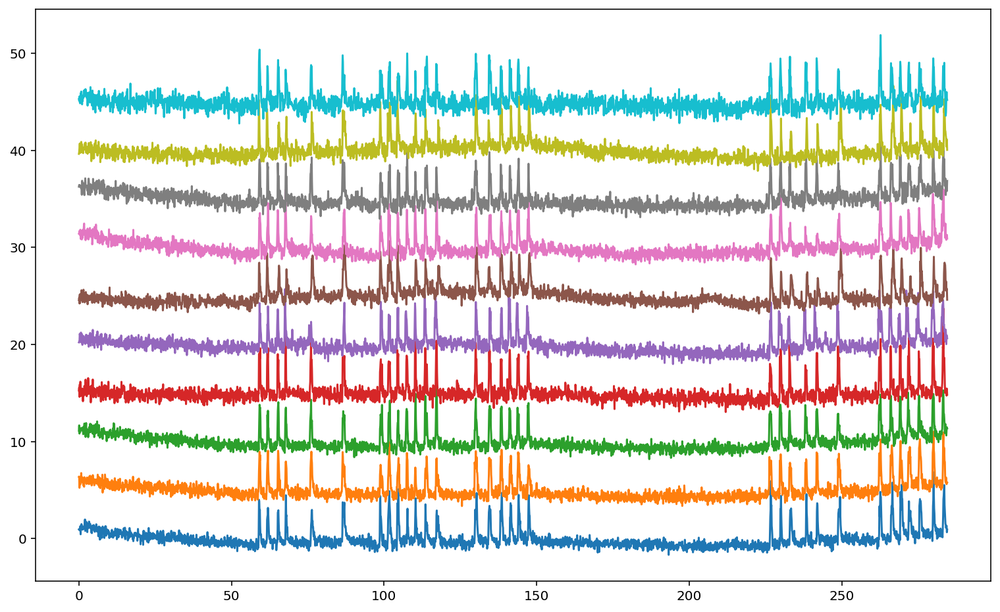

In [33]:
timeSlice = slice(0,3000)
t = time[timeSlice]
plt.figure(figsize=(13,8))
for ia,i in enumerate(investigateIndex):
    x = C.loc[i,"trace"][timeSlice]
    xd = mydebleach(x)
    x = x-xd
    x = (x-x.mean())/x.std()
    plt.plot(t,x+5*ia)

In [30]:
# plotting definition
def plotInteresting(investigateIndex_,
                    onlyImage=False,
                    figsize = (10,10),
                    std=True
                   ):
    fig, axs = plt.subplots(1,2,figsize=[figsize[0],figsize[1]/2], sharex=True, sharey=True)
#     for ax,im in zip(axs,["std_0_dbl","template"]):
#         try:
#             showImage = images[im].astype("float")
#         except:
#             continue
#         if "std" in im:
#             ax.imshow(.01+showImage,cmap="Greys",norm=LogNorm(),vmax=showImage.max()*10)
#         else:
#             x = np.arctan(30*showImage)
#             v = np.percentile(np.abs(x),99)*4
#             im = ax.imshow(x,cmap="bwr", vmin=-v, vmax=v)
    ax = axs[0]
    x = regions.image
    ax.imshow(x,cmap="bwr", vmin=-10, vmax=10)
    regions.plotEdges(ix=investigateIndex_,separate=True,image=False, ax=ax)
    regions.plotPeaks(ix=investigateIndex_,image=False, ax=ax,labels=True)
    fig.show()
    
    if onlyImage: return None

    fig, axs = plt.subplots(2,1,figsize=figsize, sharex=True)
    ia = 0
    n = 1
    ns = 2

    # inax = inset_axes(axs[0],
    #                     width="30%", # width = 30% of parent_bbox
    #                     height=1.2, # height : 1 inch
    #                     loc=2)
    # showImage = images["std_dres"].astype("float")
    # inax.imshow(.1+showImage,cmap="Greys",norm=LogNorm(),vmax=showImage.max()*10)
    # regions.plotEdges(ix=investigateIndex_,separate=True,ax=inax)
    t = rebin(time,n)
    for roi in investigateIndex_:
        x  = rebin(C.loc[roi,"trace"],n)
        xf = rebin(C.loc[roi,valName],n)
        xsd= rebin(C.loc[roi,stdName],n)/n**.5
        xs = rebin(C.loc[roi,valName.replace("faster","slower")],n)
        eventFilter = posRender[np.where(C.index==roi)[0][0]]

        xsd= xsd/xf.std()
        xf = xf/xf.std()

        c  = "C%i"%(roi%10)
        axs[0].plot(t,x [::],c=c,lw=.4,alpha = .3)
        axs[0].plot(t,xs[::],c=c,lw=.7,alpha = 1)
        axs[0].plot(t[eventFilter],xs[eventFilter],".",c=c,ms=2,alpha = .2)
        yoffset = 5*ia
        axs[1].plot(t,xf[::]+yoffset,c=c,lw=.3)
        if std:
            axs[1].plot(t,+ns*xsd[::]+yoffset,c=c,lw=.7)
            axs[1].plot(t,-ns*xsd[::]+yoffset,c=c,lw=.7)
        axs[1].axhline(yoffset,color=c,label=roi,lw=.5)
        axs[1].text(0,yoffset,str(roi)+" ",fontdict={"color":c},ha="right",va="center")
        axs[0].text(0,xs[0],str(roi)+" ",fontdict={"color":c},ha="right",va="center")
    # axs[1].legend(loc=(1.01,.01))
    # #     x,y = C.loc[roi,"peak"]#np.mean(C.loc[i,"pixels"],axis=0)
    # #     inax.plot(x,y,"o",mfc="none",ms=C.loc[i,"size"]**.5/2,c=c,mew=.3)
    #     bb = list(C.loc[roi,"boundary"])
    #     bb += [bb[0]]
    #     x,y = np.array(bb).T
    #     inax.plot(x,y,c=c,lw=.5)
        ia += 1
    # yl = axs[0].get_ylim()[1]
    # axs[0].set_ylim(None,yl*1.2)

    # plt.xticks([])
    # plt.yticks([])
    fig.tight_layout()
    fig.show()

In [ ]:
%matplotlib notebook

In [ ]:
plotInteresting(investigateIndex[:],
#                 onlyImage=True
               )

## save

In [592]:
# plt.figure()
# plt.hist(np.diff(np.where(eventFilter)[0]))

In [594]:
regionSaveName = baseName+"_regions.pkl"

In [595]:
import pickle

In [597]:
regions.std_dres_image = images["std_dres"].astype(float)

In [601]:
if os.path.isfile(regionSaveName):
    print (regionSaveName, "exists. Please choose a different name.")
else:
    with open(regionSaveName,"wb") as f:
        pickle.dump(regions,f)

In [602]:
regionSaveName

'local_data/Sandra/2020_01_14/Experiment45b/Experiment45b_1_Series006-008_regions.pkl'

# Show Movie

In [35]:
timeSlice = slice(
    int(len(m_orig)*0.0),  # in percentages
    int(len(m_orig)*0.1)   # in percentages
)

nTimeFrames = 200
nRebinShow = len(m_orig[timeSlice])//nTimeFrames
border = np.ones((nTimeFrames,1,m_orig.shape[-1]))*m_orig.max()
m2show = rebin(m_orig[timeSlice].astype(np.float32), nRebinShow)

In [36]:
showMovie(np.log(.1+m2show),figsize=(13,6))